# Visualize the output

In [4]:
import sys
sys.path.append("/people/m344313/TMA_Graph_Embedding")
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
from itertools import islice

from src.utils import align_df_with_G_all



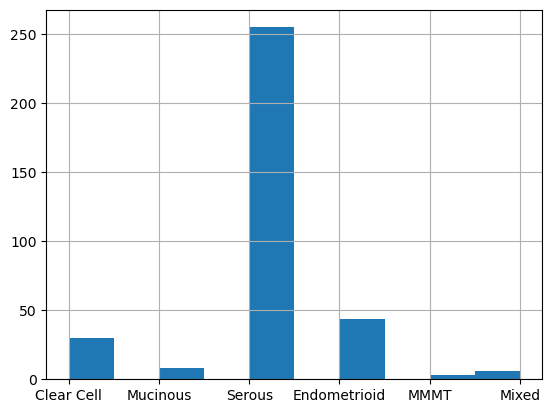

In [7]:
df = pd.read_csv('/projects/wangc/m344313/OVTMA_project/data/OVTMA_fov297/OVTMA22_metadata.csv')
df['histology'].value_counts()
df['histology'].hist()
plt.show()


In [8]:
G_all_path = '/projects/wangc/m344313/OVTMA_project/output/fov297_fastrp_het/graphs/G_all_gabriel.pkl'
with open(G_all_path, 'rb') as f:
    G_all = pickle.load(f)
df = pd.read_csv("/projects/wangc/m344313/OVTMA_project/output/fov297_fastrp_het/dataframes/df.csv")
df_aligned = align_df_with_G_all(df, G_all)


# assign each phenotype a unique color
from matplotlib.colors import hsv_to_rgb
cmap = {p: hsv_to_rgb((i/len(df['phenotype'].unique()), 1, 1)) for i, p in enumerate(df['phenotype'].unique())}


{'meta_1': array([1., 0., 0.]), 'meta_2': array([1. , 0.6, 0. ]), 'meta_3': array([0.8, 1. , 0. ]), 'meta_4': array([0.2, 1. , 0. ]), 'meta_5': array([0. , 1. , 0.4]), 'meta_6': array([0., 1., 1.]), 'meta_7': array([0. , 0.4, 1. ]), 'meta_8': array([0.2, 0. , 1. ]), 'meta_10': array([0.8, 0. , 1. ]), 'meta_9': array([1. , 0. , 0.6])}


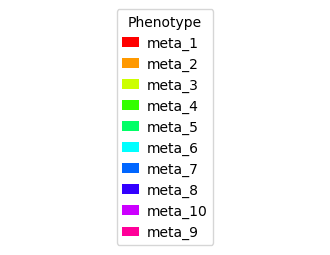

In [9]:
print(cmap)
# plot a legend(legend_elements )
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
# or: from matplotlib.lines import Line2D

labels = list(cmap.keys())
handles = [Patch(facecolor=cmap[l], edgecolor='none', label=l) for l in labels]
# If you prefer dot markers instead of color squares:
# handles = [Line2D([], [], marker='o', linestyle='', color=cmap[l], label=l, markersize=8) for l in labels]

fig, ax = plt.subplots(figsize=(4, 3))
leg = ax.legend(
    handles=handles,
    title="Phenotype",
    ncol=1,              # change to 2/3… if you want multiple columns
    frameon=True,
    handlelength=1.2,
    handletextpad=0.6,
    borderaxespad=0.2,
    loc="center"
)
ax.set_axis_off()
plt.show()


## plot cells

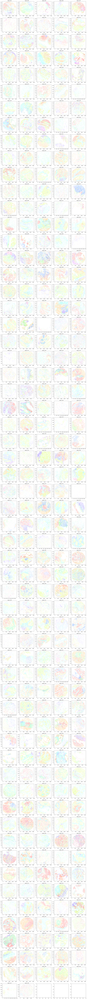

In [14]:
import pandas as pd
import matplotlib.pyplot as plt


def plot_cells(df: pd.DataFrame, ax=None, s=4, alpha=0.8):
    if ax is None:
        fig, ax = plt.subplots()
    for ct, d in df.groupby("phenotype"):
        color = cmap.get(ct, "lightgray")
        ax.scatter(d["x"], d["y"], s=s, alpha=alpha, label=str(ct), color=color)

    #ax.set_aspect("equal")
    #ax.legend(title="Phenotype", fontsize=8)
    #ax.set_xlabel("x"); ax.set_ylabel("y")
    return ax
# divide df into each ROI, and plot the cells in each ROI in grid
n_roi = len(df['ROI'].unique())
n_cols = 5
n_rows = n_roi // n_cols + 1
fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(5*n_cols, 5*n_rows))
for i, roi in enumerate(df['ROI'].unique()):
    ax = axs[i // n_cols, i % n_cols]
    plot_cells(df[df['ROI'] == roi], ax=ax,s=.25)
    ax.set_title(roi)
plt.show()

## plot graphs

region_002


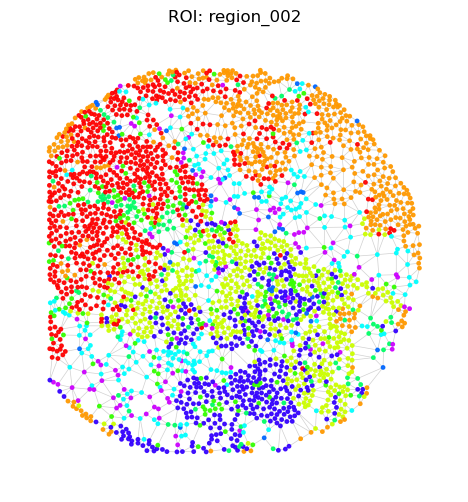

region_004


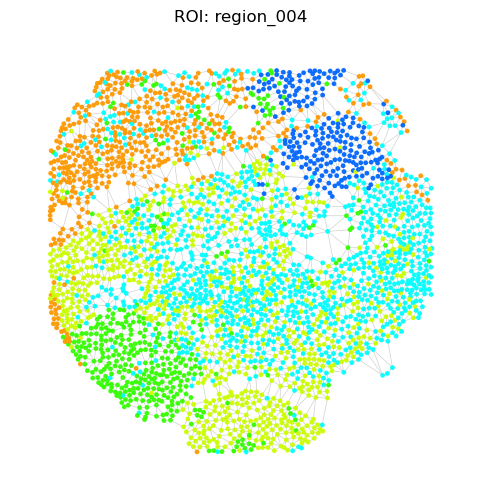

region_005


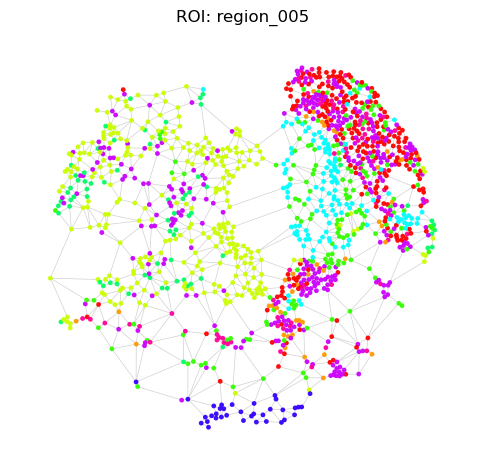

region_006


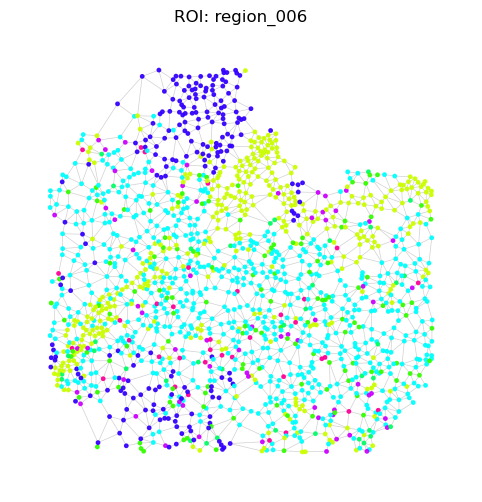

region_007


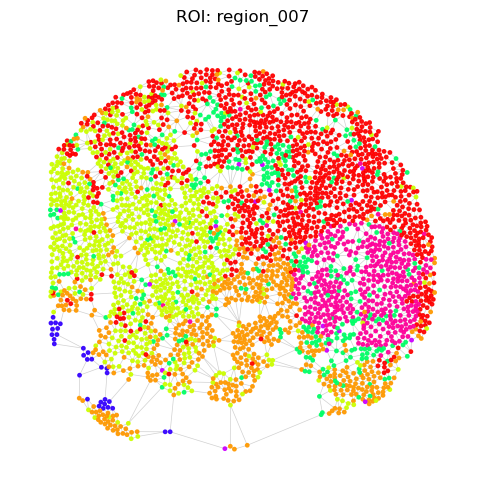

region_008


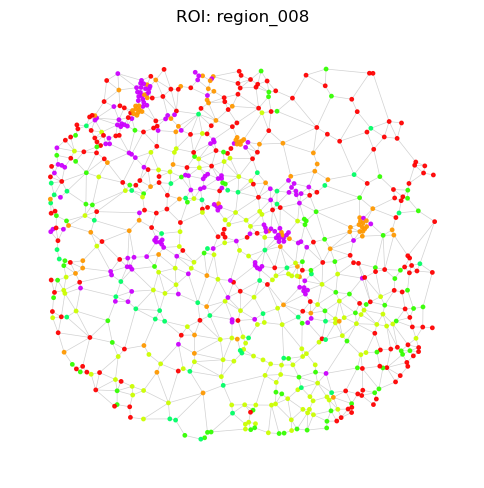

region_009


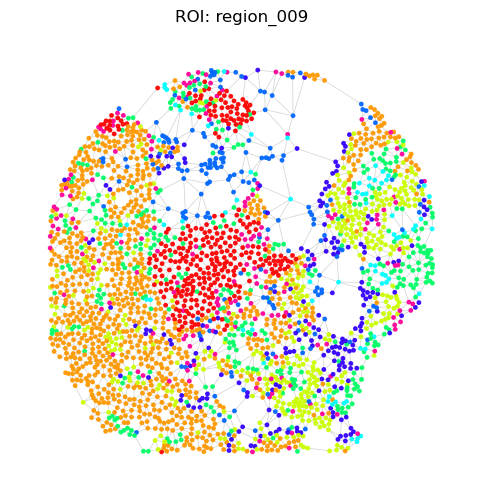

region_010


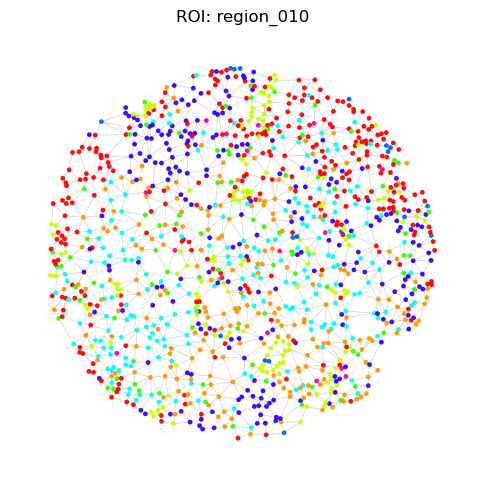

region_012


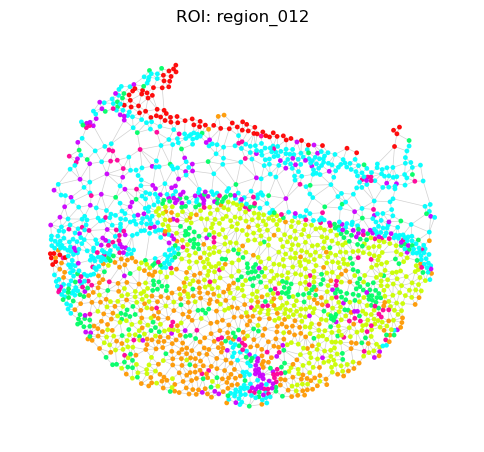

region_013


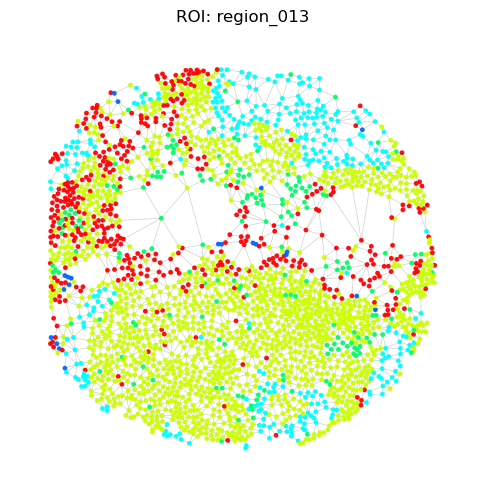

region_014


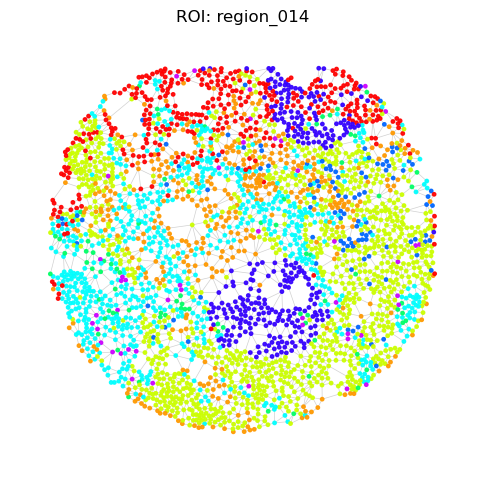

region_015


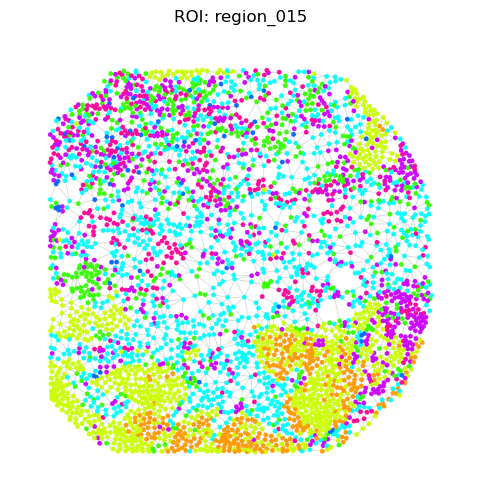

region_016


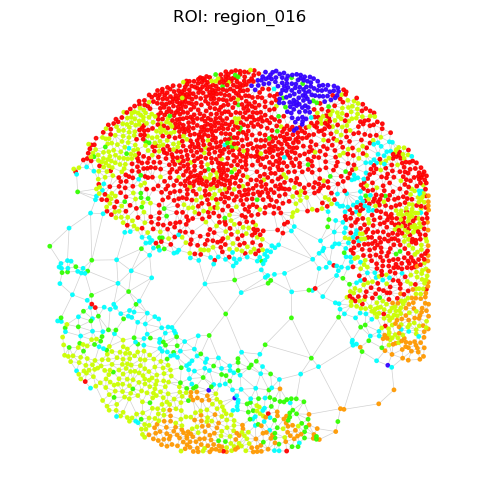

region_017


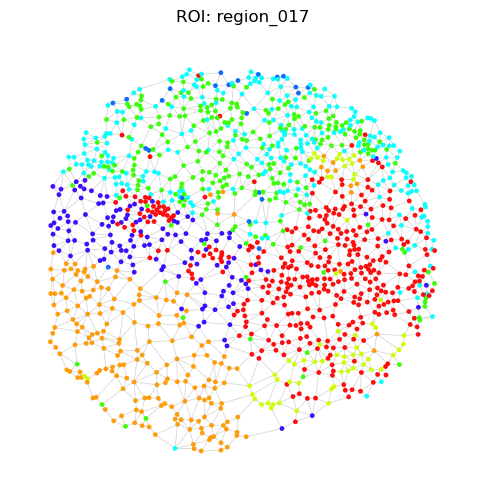

region_018


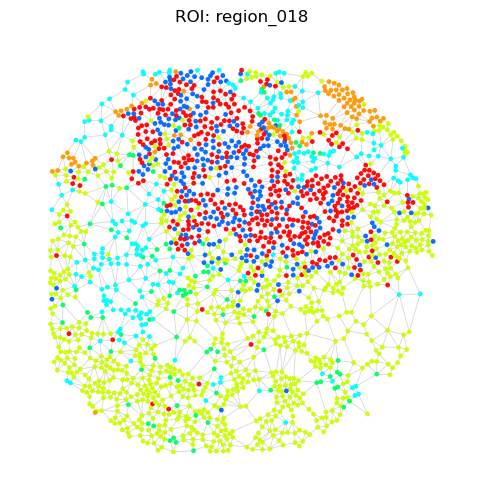

region_019


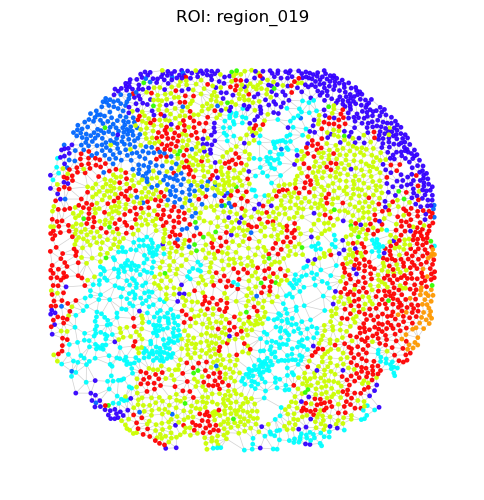

region_020


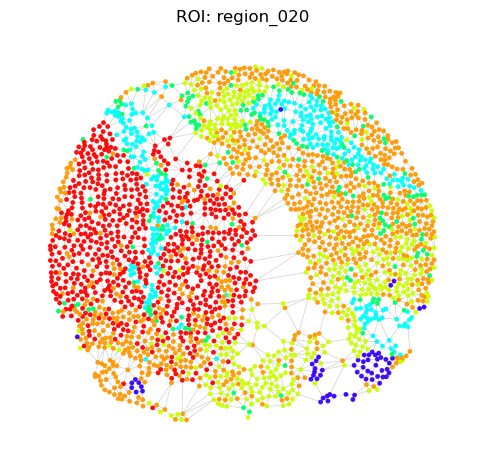

region_021


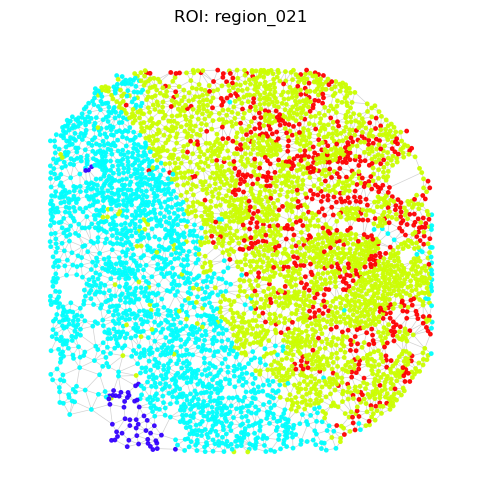

region_022


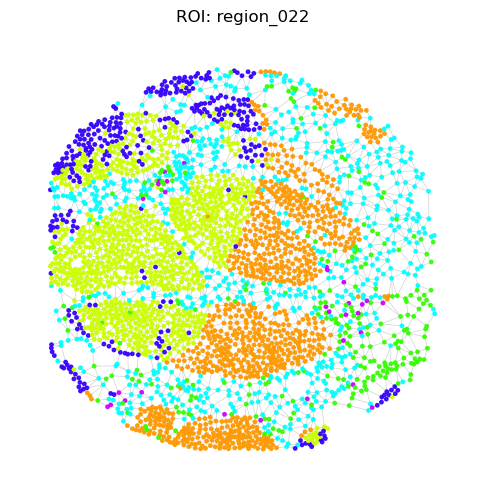

region_024


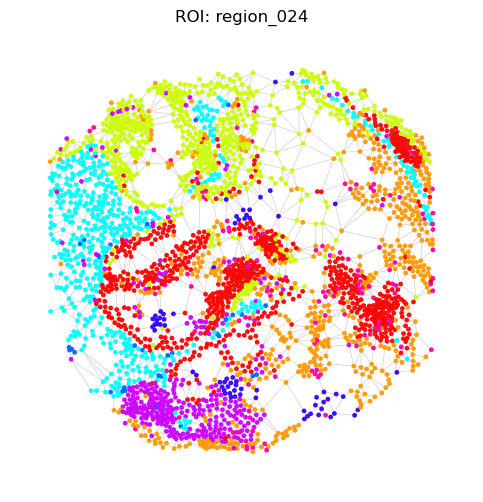

In [18]:

default_color = 'lightgray'
roi_col, id_col = "ROI", "cell_id"     # adjust if different
x_col, y_col   = "x", "y"              # adjust if different

# collect all ROI names present in G_all
all_rois = sorted({roi for (roi, _) in G_all.nodes()})

N = 20
for roi in islice(all_rois, N):
    # nodes for this ROI
    nodes_roi = [n for n in G_all.nodes() if n[0] == roi]
    if not nodes_roi:
        continue
    G_sub = G_all.subgraph(nodes_roi).copy()

    # align df to subgraph node order
    df_aligned = align_df_with_G_all(df, G_sub)

    # build positions dict from aligned df (expects x/y columns in df)
    pos = {node: (row[x_col], row[y_col]) for node, row in df_aligned.iterrows()}

    # node colors from phenotype
    pheno = df_aligned["phenotype"].astype(str)
    node_colors = [cmap.get(p, default_color) for p in pheno.values]

    # plot
    print(roi)
    fig, ax = plt.subplots(figsize=(6, 6))
    nx.draw(
        G_sub,
        pos=pos,
        ax=ax,
        node_size=6,
        node_color=node_colors,
        edge_color="#cccccc",
        width=0.5,
        alpha=0.9,
        with_labels=False,
    )
    ax.set_title(f"ROI: {roi}")
    ax.set_aspect("equal", adjustable="box")
    ax.axis("off")
    plt.show()
    plt.close(fig)

## plot umaps with embeddings
>> for each A^k, see whether the embeddings show separation pattern

In [25]:

def align_df_with_G_all(df, G_all):
    roi_col = "ROI"
    id_col  = "cell_id"  
    # 1) Build the target index from the graph's nodes (keeps the graph's order)
    node_index = pd.MultiIndex.from_tuples(list(G_all.nodes()),
                                        names=[roi_col, id_col])
    # 2) Set a matching MultiIndex on df
    #    (fails loudly if duplicates — better than silently picking a row)
    df_idxed = df.set_index([roi_col, id_col])
    if df_idxed.index.has_duplicates:
        print("Duplicates found in df")
        # pick the first occurrence per (ROI, cell_id); or use a different reducer
        df_idxed = df_idxed[~df_idxed.index.duplicated(keep="first")]

    # 3) Reindex to align order exactly to G_all.nodes()
    df_aligned = df_idxed.reindex(node_index)
    return df_aligned

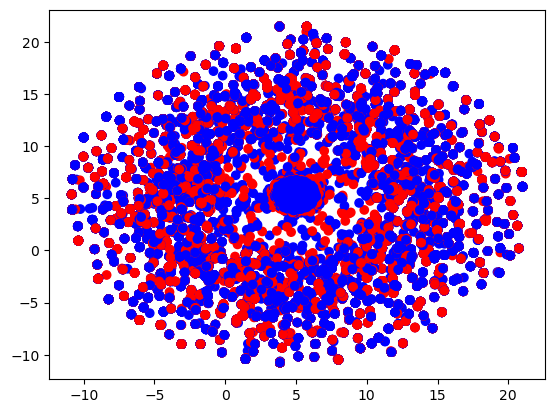

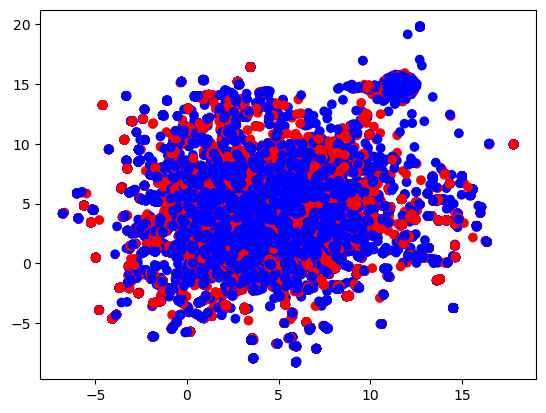

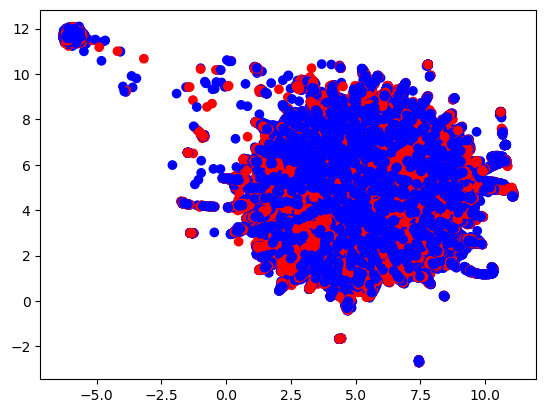

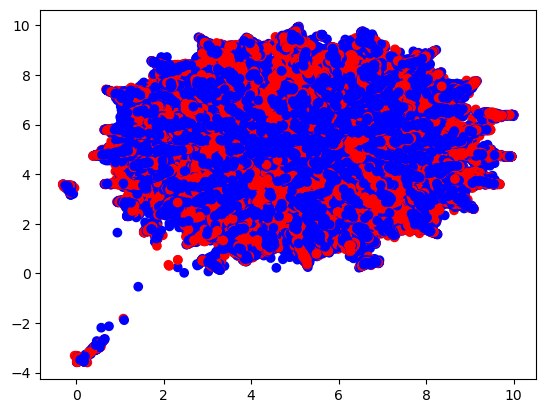

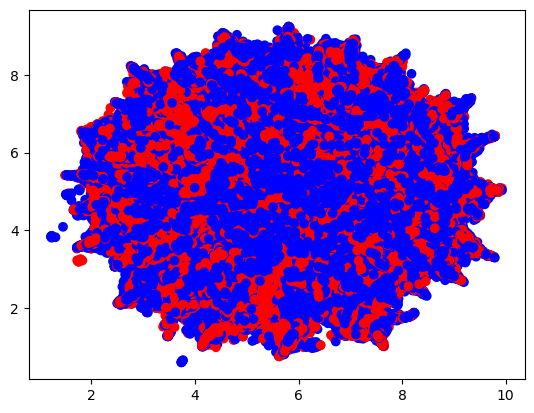

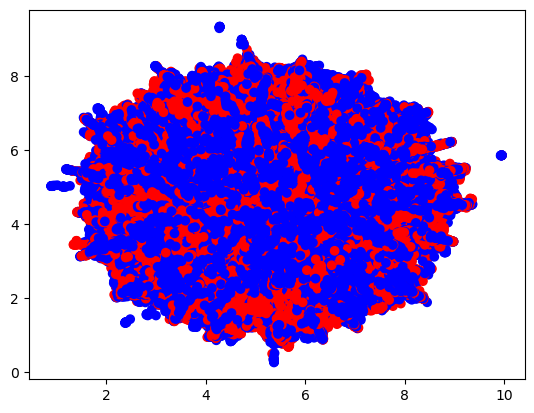

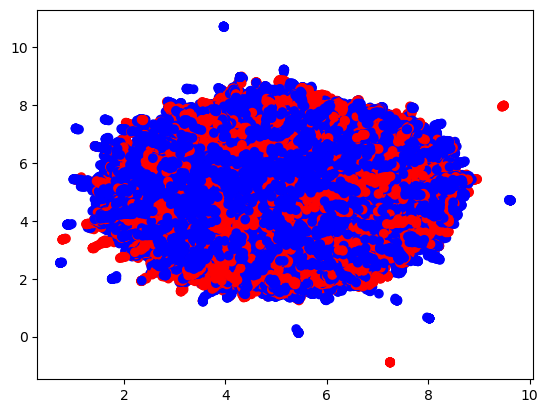

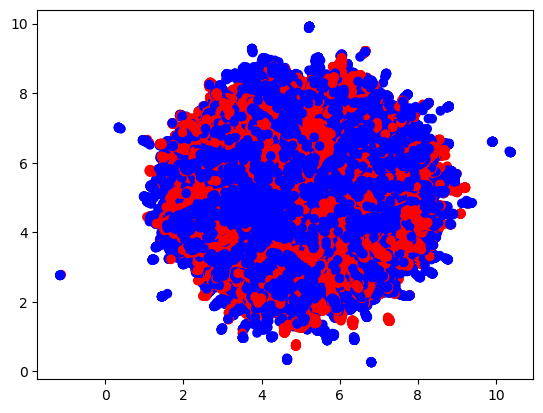

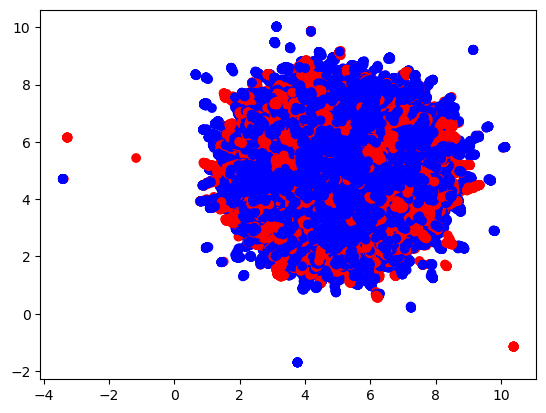

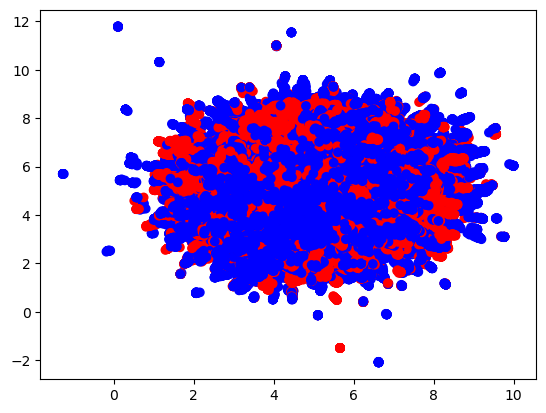

In [26]:
import scipy.io
import matplotlib.pyplot as plt
import pandas as pd
#from src.utils import align_df_with_G_all

# reorder df according to G_all.nodes() order
G_all_path = '/home/yxiao/TMA22_Sep8_Skeleton/output/OVTMA_fov216/graphs/G_all_gabriel.pkl'
with open(G_all_path, 'rb') as f:
    G_all = pickle.load(f)
df = pd.read_csv("/home/yxiao/TMA22_Sep8_Skeleton/output/OVTMA_fov216/data/df.csv")
df_aligned = align_df_with_G_all(df, G_all)

for i in range(1,11):   
    umap_embedding_path = f'/home/yxiao/TMA22_Sep8_Skeleton/output/OVTMA_fov216/basis_embedding/alpha_-0.5/umap/basis_{i}.mat'
    umap_embedding = scipy.io.loadmat(umap_embedding_path)["U"]
    #df = pd.read_csv("../output/OVTMA_fov216/data/df.csv")

    cmap = {'meta_2':'red','meta_3':'blue'}
    plt.scatter(umap_embedding[:,0], umap_embedding[:,1], c=df_aligned["phenotype"].map(cmap))
    plt.show()